## Finding out missing dates

In [1]:
from datetime import datetime 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
# needed to see all our dates in the output
pd.options.display.max_rows = 999

In [2]:
df = pd.read_csv("/Users/sathwikkes/Desktop/CASE_STUDY_DATA.csv")
df.head()

,original_article_title,url,locale,article_ID,published_date,vertical,traffic_channel,page_views
0,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,News Aggregators,10786
1,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Other,891
2,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Search,42337
3,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Social,39673
4,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/en_us/article/z3xw3x/new-research...,en_us,z3xw3x,7/14/21,Motherboard,News Aggregators,173275


In [3]:
df.isnull().sum()

original_article_title    0
url                       0
locale                    0
article_ID                0
published_date            0
vertical                  0
traffic_channel           0
page_views                0
dtype: int64

In [4]:
x = len(df.published_date.unique())
x

87

In [5]:
dates = df.published_date.unique()
dates

array(['7/14/21', '5/12/21', '7/7/21', '7/1/21', '6/7/21', '7/22/21',
       '6/8/21', '5/24/21', '5/3/21', '6/28/21', '7/20/21', '5/10/21',
       '7/23/21', '7/16/21', '5/7/21', '7/8/21', '5/19/21', '7/15/21',
       '6/25/21', '5/27/21', '5/5/21', '6/17/21', '5/11/21', '7/29/21',
       '6/3/21', '7/26/21', '5/6/21', '5/4/21', '7/10/21', '5/21/21',
       '5/18/21', '7/12/21', '6/22/21', '5/14/21', '6/23/21', '6/29/21',
       '6/24/21', '5/17/21', '7/28/21', '7/9/21', '7/31/21', '5/26/21',
       '6/30/21', '6/4/21', '5/23/21', '5/29/21', '7/21/21', '6/18/21',
       '6/15/21', '7/13/21', '5/22/21', '7/2/21', '7/19/21', '6/16/21',
       '5/13/21', '5/28/21', '6/2/21', '6/1/21', '7/30/21', '7/17/21',
       '7/25/21', '6/26/21', '6/14/21', '5/15/21', '7/6/21', '7/18/21',
       '7/27/21', '7/4/21', '6/19/21', '5/16/21', '6/12/21', '6/9/21',
       '6/10/21', '7/24/21', '6/27/21', '5/30/21', '6/11/21', '5/20/21',
       '5/25/21', '6/21/21', '5/9/21', '6/6/21', '5/1/21', '7/11/21',


In [6]:
date_df = pd.DataFrame(dates, columns = ["dates"])
date_df.sort_values(by=["dates"])

,dates
82,5/1/21
11,5/10/21
22,5/11/21
1,5/12/21
54,5/13/21
33,5/14/21
63,5/15/21
69,5/16/21
37,5/17/21
30,5/18/21


In [7]:
#https://www.geeksforgeeks.org/check-missing-dates-in-pandas/
date_df = date_df.set_index('dates')
 
# to_datetime() method converts string
# format to a DateTime object
date_df.index = pd.to_datetime(date_df.index)
 
# dates which are not in the sequence
# are returned
print(pd.date_range(
  start="2021-05-01", end="2021-07-31").difference(date_df.index))

DatetimeIndex(['2021-05-02', '2021-05-08', '2021-06-13', '2021-06-20',
               '2021-07-03'],
              dtype='datetime64[ns]', freq=None)


In [8]:
print (date_df.index.min())
print (date_df.index.max())

2021-05-01 00:00:00
2021-07-31 00:00:00


In [9]:
date_df

""
dates
2021-07-14
2021-05-12
2021-07-07
2021-07-01
2021-06-07
2021-07-22
2021-06-08
2021-05-24
2021-05-03


In [76]:
df.shape

(6015, 8)

## Text Analysis

In [10]:
df.vertical.unique()

array(['Motherboard', 'US Culture', 'Horoscope'], dtype=object)

In [11]:
test = df.groupby(['vertical', 'traffic_channel'])

In [12]:
test.sum()

page_views
vertical    traffic_channel             
Horoscope   News Aggregators      354516
            Other                 195792
            Search               5953087
            Social                107987
Motherboard News Aggregators     1776563
            Other                1264821
            Search               6145063
            Social               8102016
US Culture  News Aggregators      706765
            Other                 540989
            Search               2171636
            Social               3371811

In [13]:
test[["original_article_title"]].count()

original_article_title
vertical    traffic_channel                         
Horoscope   News Aggregators                     144
            Other                                144
            Search                               144
            Social                               144
Motherboard News Aggregators                     718
            Other                                725
            Search                               725
            Social                               725
US Culture  News Aggregators                     633
            Other                                637
            Search                               638
            Social                               638

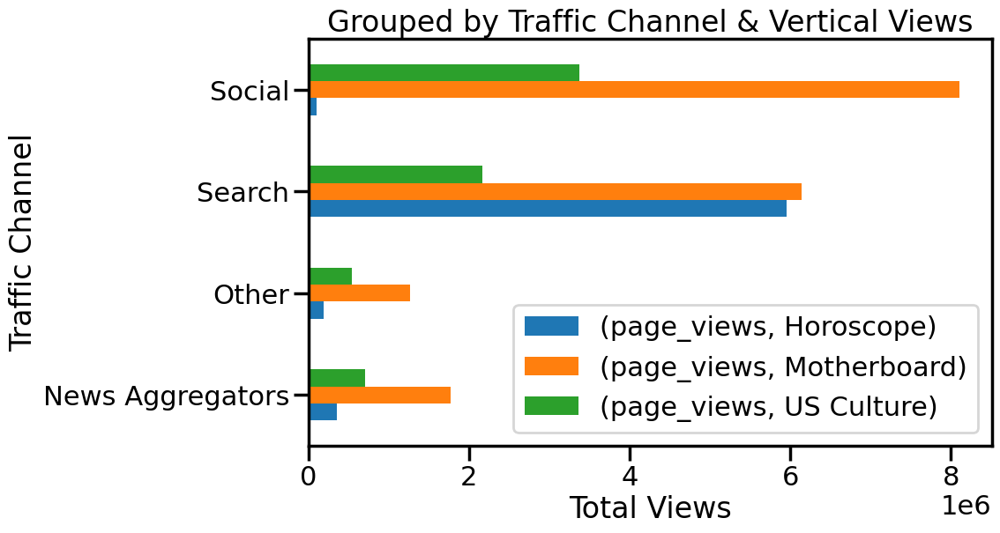

In [64]:
test.sum().unstack(0).plot(kind="barh", figsize=(10,6))
plt.title("Grouped by Traffic Channel & Vertical Views")
plt.xlabel('Total Views')
plt.ylabel('Traffic Channel')
plt.legend(loc='best')
plt.show()

In [47]:
import plotly.express as px

In [56]:
grouped = df.groupby(['vertical', 'traffic_channel'])['page_views'].sum().reset_index()

In [57]:
grouped

,vertical,traffic_channel,page_views
0,Horoscope,News Aggregators,354516
1,Horoscope,Other,195792
2,Horoscope,Search,5953087
3,Horoscope,Social,107987
4,Motherboard,News Aggregators,1776563
5,Motherboard,Other,1264821
6,Motherboard,Search,6145063
7,Motherboard,Social,8102016
8,US Culture,News Aggregators,706765
9,US Culture,Other,540989


In [94]:
rebalanced_df = df[df["locale"]!="en_us"]

,original_article_title,url,locale,article_ID,published_date,vertical,traffic_channel,page_views
0,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,News Aggregators,10786
1,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Other,891
2,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Search,42337
3,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/de/article/z3xw3x/zusammenbruch-d...,de,z3xw3x,7/14/21,Motherboard,Social,39673
8,MIT Predicted in 1972 That Society Will Collap...,www.vice.com/es/article/z3xw3x/mit-predijo-197...,es,z3xw3x,7/14/21,Motherboard,News Aggregators,776
...,...,...,...,...,...,...,...,...
6010,China Is Running Out of Lab Monkeys To Experim...,www.vice.com/id_id/article/jg8mdd/tiongkok-kek...,id_id,jg8mdd,5/14/21,US Culture,Social,238
6011,China Is Running Out of Lab Monkeys To Experim...,www.vice.com/ro/article/jg8mdd/china-experimen...,ro,jg8mdd,5/14/21,US Culture,News Aggregators,13
6012,China Is Running Out of Lab Monkeys To Experim...,www.vice.com/ro/article/jg8mdd/china-experimen...,ro,jg8mdd,5/14/21,US Culture,Other,11
6013,China Is Running Out of Lab Monkeys To Experim...,www.vice.com/ro/article/jg8mdd/china-experimen...,ro,jg8mdd,5/14/21,US Culture,Search,116


In [99]:
grouped = rebalanced_df.groupby(['locale', 'traffic_channel'])['page_views'].sum().reset_index()

# Create a stacked bar chart using Plotly Express
fig = px.bar(grouped, x='locale', y='page_views', color='traffic_channel',
             title='Locale Breakdown by Traffic Source')

# Show the plot
fig.show()

In [102]:
us_df = df[df['locale'] == "en_us"]
grouped = us_df.groupby(['locale', 'traffic_channel'])['page_views'].sum().reset_index()

# Create a stacked bar chart using Plotly Express
fig = px.bar(grouped, x='locale', y='page_views', color='traffic_channel',
             title='United States Breakdown by Traffic Source')

# Customize the layout (optional)
fig.update_layout(
    autosize=False,
    showlegend=False,

)
# Show the plot
fig.show()

In [15]:
df.groupby(['locale', 'traffic_channel']).sum()

page_views
locale   traffic_channel             
ar       News Aggregators           4
         Other                      4
         Search                   261
         Social                   290
be       News Aggregators          14
         Other                    220
         Search                   890
         Social                  5473
de       News Aggregators       51792
         Other                  10680
         Search                543078
         Social                166598
en_uk    News Aggregators       82021
         Other                   7993
         Search                 95977
         Social                230388
en_us    News Aggregators     2544475
         Other                1880944
         Search              13020441
         Social               9983776
es       News Aggregators        3311
         Other                   4396
         Search                 27913
         Social                 77008
es_latam News Aggregators        4267
         Other                  20644
         Search                 62928
         Social                 90961
fr       News Aggregators      108020
         Other                   7914
         Search                209239
         Social                 82039
gr       News Aggregators         223
         Other                  47865
         Search                 12995
         Social                 33013
id_id    News Aggregators         495
         Other                   1989
         Search                 22285
         Social                218208
it       News Aggregators       36755
         Other                   9996
         Search                143869
         Social                287099
jp       News Aggregators         182
         Other                     50
         Search                   278
         Social                   270
kr       News Aggregators          17
         Other                   3242
         Search                  1225
         Social                   270
nl       News Aggregators        4073
         Other                   3282
         Search                 24099
         Social                151439
ro       News Aggregators        1718
         Other                   1902
         Search                 91783
         Social                218128
rs       News Aggregators         477
         Other                    481
         Search                 12525
         Social                 36854

In [80]:
len(df['locale'].unique())

16

In [16]:
#subsetting the data respective to each sector 
motherboard_df = df[df['vertical']=="Motherboard"]
US_Culture_df = df[df['vertical']=="US Culture"]
horoscope_df = df[df['vertical']=="Horoscope"]

In [17]:
search_motherboard_df = df[(df['vertical']=="Motherboard") & (df["traffic_channel"] == "Search")]

In [18]:
search_motherboard_df.describe()

,page_views
count,725.000000
mean,8475.948966
std,25514.655864
min,27.000000
25%,776.000000
50%,2038.000000
75%,5902.000000
max,449059.000000


In [19]:
social_motherboard_df = df[(df['vertical']=="Motherboard") & (df["traffic_channel"] == "Social")]

In [20]:
social_motherboard_df.describe()

,page_views
count,725.000000
mean,11175.194483
std,35658.738098
min,9.000000
25%,743.000000
50%,1984.000000
75%,6512.000000
max,604122.000000


In [21]:
other_motherboard_df = df[(df['vertical']=="Motherboard") & (df["traffic_channel"] == "Other")]

In [22]:
other_motherboard_df.describe()

,page_views
count,725.000000
mean,1744.580690
std,9021.358942
min,1.000000
25%,108.000000
50%,291.000000
75%,827.000000
max,193136.000000


In [23]:
newsa_motherboard_df = df[(df['vertical']=="Motherboard") & (df["traffic_channel"] == "News Aggregators")]

In [24]:
newsa_motherboard_df.describe()

,page_views
count,718.000000
mean,2474.321727
std,10585.192050
min,1.000000
25%,69.250000
50%,245.500000
75%,1024.000000
max,173275.000000


In [25]:
motherboard_df.describe()

,page_views
count,2893.000000
mean,5975.963705
std,23352.307912
min,1.000000
25%,198.000000
50%,813.000000
75%,3016.000000
max,604122.000000


In [26]:
US_Culture_df.describe()

,page_views
count,2546.000000
mean,2667.400236
std,8005.687130
min,1.000000
25%,180.250000
50%,679.000000
75%,2167.250000
max,168316.000000


In [27]:
horoscope_df.describe()

,page_views
count,576.00000
mean,11478.09375
std,20673.48443
min,119.00000
25%,715.50000
50%,1538.00000
75%,6957.75000
max,116298.00000


In [73]:
len(motherboard_df["original_article_title"].unique())

558

In [75]:
df.shape

(6015, 8)

In [28]:
motherboard_df.sort_values(by="page_views", ascending=False)['original_article_title'].unique()

array(["Judge Has No Patience for 'BUTTFUCKER 3000' in Zoom Court",
       "MIT Predicted in 1972 That Society Will Collapse This Century. New Research Shows We're on Schedule.",
       'Science YouTuber Wins $10,000 Bet With Physicist',
       'Scientists Studying Temperature at Which Humans Spontaneously Die With Increasing Urgency',
       "Delivery App CEO Accuses Protesting Workers of 'Political Ambition' ",
       "Riders for Europe's Delivery 'Unicorn' Report Grueling Delivery Times and Back Pain",
       'A Defunct Video Hosting Site Is Flooding Normal Websites With Hardcore Porn',
       'Amazon Denied a Worker Pregnancy Accommodations. Then She Miscarried.',
       "Uber and Lyft Can't Find Drivers Because Gig Work Sucks",
       "McDonald's Workers Will Strike for $15 an Hour in 15 Cities",
       'She Sent Her iPhone to Apple. Repair Techs Uploaded Her Nudes to Facebook',
       "I'm a Frito-Lay Factory Worker. I Work 12-Hour Days, 7 Days a Week",
       "Scientists Extract

In [29]:
US_Culture_df.sort_values(by="page_views", ascending=False)['original_article_title'].unique()

array(['Starbucks Baristas Are Sick of Your Ridiculous Custom Orders',
       'I Have Herpes. This Is How It Affects My Sex Life',
       "What Happened to C.C. Babcock from 'The Nanny'?",
       "This Comedian Shows How Dumb the 'Critical Race Theory' Panic Is",
       'This Influencer Accidentally Unleashed a Venomous Cobra on His Neighbors',
       'How to Make Your Penis Seem Bigger, During Sex or Forever',
       "Britney Spears Is Finally Able to Speak Out on Instagram—and She's Not Holding Back",
       'Forcing Someone to Keep an IUD in Is a Form of Abuse',
       "What To Do If You Get a 'Wrong Number' Text From a 'Blonde' Named 'Amanda'",
       'Vaxxed? Iceland Actually Wants You to Come Be a Tourist',
       'How to Test Your Drugs for Fentanyl',
       'Got $500 to Spare? You Can Buy a House in Japan ',
       "This Guy's Drunk Texts to an Aquarium Are Ridiculously Wholesome",
       'The Three Tiers of Cheuginess, Explained',
       'Why Are Boomer Parents Always Withhold

In [30]:
corpus = df.original_article_title.unique()
corpus

array(["MIT Predicted in 1972 That Society Will Collapse This Century. New Research Shows We're on Schedule.",
       "Judge Has No Patience for 'BUTTFUCKER 3000' in Zoom Court",
       'Scientists Studying Temperature at Which Humans Spontaneously Die With Increasing Urgency',
       ...,
       'A Plan to Tame Labor Unions for Uber and Lyft Has Been Scrapped In New York',
       "'Micro Grants' Are Keeping Virginians Afloat While Waiting For Unemployment",
       'China Is Running Out of Lab Monkeys To Experiment On'],
      dtype=object)

## Checking out unique article titles for each vector

In [31]:
US_culture_corpus = US_Culture_df.original_article_title.unique()
US_culture_corpus

array(['Science YouTuber Wins $10,000 Bet With Physicist',
       'I Have Herpes. This Is How It Affects My Sex Life',
       'Starbucks Baristas Are Sick of Your Ridiculous Custom Orders',
       "This Comedian Shows How Dumb the 'Critical Race Theory' Panic Is",
       'Got $500 to Spare? You Can Buy a House in Japan ',
       "What Happened to C.C. Babcock from 'The Nanny'?",
       'How to Make Your Penis Seem Bigger, During Sex or Forever',
       "What to Do if You're Barely Keeping It Together Right Now",
       'The Three Tiers of Cheuginess, Explained',
       "What To Do If You Get a 'Wrong Number' Text From a 'Blonde' Named 'Amanda'",
       "What to Do When Your 'Straight' Boyfriend Comes Out to You as Bi",
       "The 'Liking Gap' Might Be Why You Wonder if People Secretly Hate You",
       'This Influencer Accidentally Unleashed a Venomous Cobra on His Neighbors',
       'How to Make Someone With a Foot Fetish Really Happy',
       'Why Are Boomer Parents Always Withholdi

In [32]:
motherboard_corpus = motherboard_df.original_article_title.unique()
motherboard_corpus

array(["MIT Predicted in 1972 That Society Will Collapse This Century. New Research Shows We're on Schedule.",
       "Judge Has No Patience for 'BUTTFUCKER 3000' in Zoom Court",
       'Scientists Studying Temperature at Which Humans Spontaneously Die With Increasing Urgency',
       'Science YouTuber Wins $10,000 Bet With Physicist',
       "Scientists Extracted DNA From 'Blood Snow' in the Alps. Here's What They Found.",
       'Amazon Delivery Companies Revolt Against Amazon, Shut Down',
       'A Defunct Video Hosting Site Is Flooding Normal Websites With Hardcore Porn',
       'She Sent Her iPhone to Apple. Repair Techs Uploaded Her Nudes to Facebook',
       "Riders for Europe's Delivery 'Unicorn' Report Grueling Delivery Times and Back Pain",
       "'I Started to Get Extremely Vengeful:' A Girls Do Porn Victim Is Still Fighting Harassment 6 Years Later",
       "Delivery App CEO Accuses Protesting Workers of 'Political Ambition' ",
       'Amazon Denied a Worker Pregnancy Acco

In [33]:
horoscope_corpus = horoscope_df.original_article_title.unique()
horoscope_corpus

array(['Daily Horoscope: July 11, 2021', 'Daily Horoscope: May 7, 2021',
       'Daily Horoscope: May 13, 2021', 'Daily Horoscope: August 1, 2021',
       'Daily Horoscope: May 6, 2021', 'Daily Horoscope: July 1, 2021',
       'Daily Horoscope: May 27, 2021', 'Daily Horoscope: May 24, 2021',
       'Daily Horoscope: May 30, 2021', 'Daily Horoscope: May 15, 2021',
       'Daily Horoscope: July 24, 2021',
       'Weekly Horoscope: June 28 - July 4',
       'Daily Horoscope: May 28, 2021', 'Weekly Horoscope: May 17 - 23',
       'Daily Horoscope: June 4, 2021', 'Daily Horoscope: July 22, 2021',
       'Daily Horoscope: May 5, 2021', 'Daily Horoscope: June 29, 2021',
       'Daily Horoscope: June 23, 2021', 'Weekly Horoscope: July 12 - 18',
       'Daily Horoscope: July 29, 2021', 'Daily Horoscope: May 23, 2021',
       'Daily Horoscope: July 3, 2021', 'Daily Horoscope: June 30, 2021',
       'Daily Horoscope: May 20, 2021', 'Daily Horoscope: June 16, 2021',
       'Daily Horoscope: May 12

In [34]:
#combinig all our titles into one big chunk of text 
#purposes of topic modelling, pinpoints which topics are covered the most
out = ' '.join(df["original_article_title"].unique())
print (out)

MIT Predicted in 1972 That Society Will Collapse This Century. New Research Shows We're on Schedule. Judge Has No Patience for 'BUTTFUCKER 3000' in Zoom Court Scientists Studying Temperature at Which Humans Spontaneously Die With Increasing Urgency Science YouTuber Wins $10,000 Bet With Physicist Scientists Extracted DNA From 'Blood Snow' in the Alps. Here's What They Found. Amazon Delivery Companies Revolt Against Amazon, Shut Down A Defunct Video Hosting Site Is Flooding Normal Websites With Hardcore Porn She Sent Her iPhone to Apple. Repair Techs Uploaded Her Nudes to Facebook Riders for Europe's Delivery 'Unicorn' Report Grueling Delivery Times and Back Pain 'I Started to Get Extremely Vengeful:' A Girls Do Porn Victim Is Still Fighting Harassment 6 Years Later Delivery App CEO Accuses Protesting Workers of 'Political Ambition'  Amazon Denied a Worker Pregnancy Accommodations. Then She Miscarried. I Have Herpes. This Is How It Affects My Sex Life WE ALL QUIT': How America's Workers

The purpose of Ngrams is to display any patterns between the word groupings that can identify main ideas regarding the text. Can be used for spelling correction, text summarization, and tokenizing
Returns the frequency of words

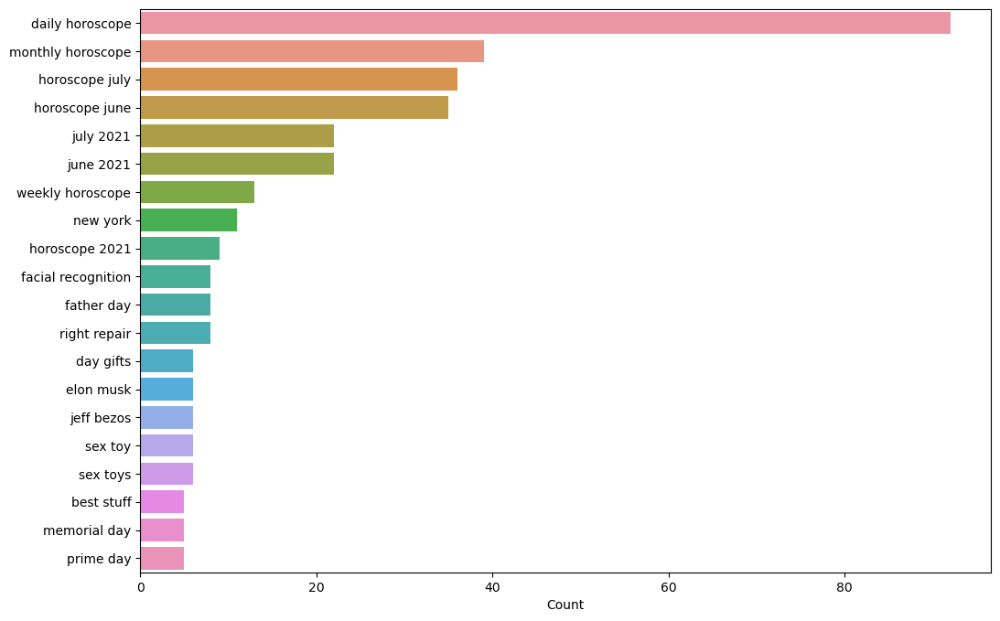

In [35]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer= "word", stop_words='english')
sparse_matrix= word_vectorizer.fit_transform(corpus)
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names_out(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count")
plt.show()

In [36]:
def count_vec(corpus, x=2, y=2):
    """
    parameters: text corpus, in our case all the responses to a column(question)
    returns: bar plot of bigrams (pairs of words) that appear most frequent
    ngrams explained: https://kavita-ganesan.com/what-are-n-grams/
    
    """
    word_vectorizer = CountVectorizer(ngram_range=(x,y), analyzer= "word", stop_words="english")
    sparse_matrix= word_vectorizer.fit_transform(corpus)
    freq = sum(sparse_matrix).toarray()[0]
    word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names_out(), columns= ['frequency'])
    word = word.nlargest(columns = "frequency", n=20)
    plt.figure(figsize=(12,8))
    ax = sns.barplot(data = word, y=word.index, x='frequency')
    sns.set_context("poster")
    ax.set(xlabel="Count", 
           ylabel="Bigrams",
           title = "Word Pairings in Vertical Titles")
    plt.show()

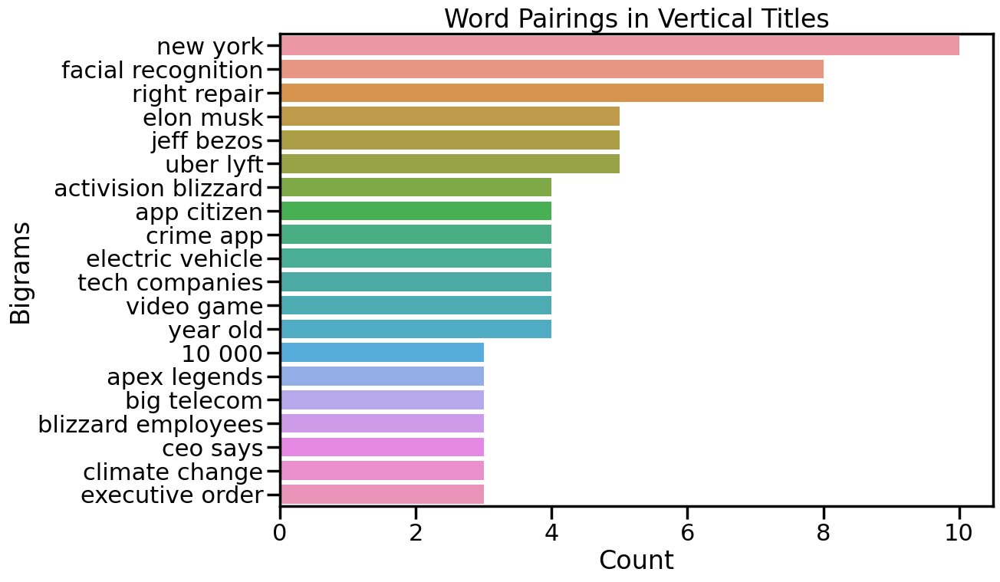

In [37]:
count_vec(motherboard_corpus)

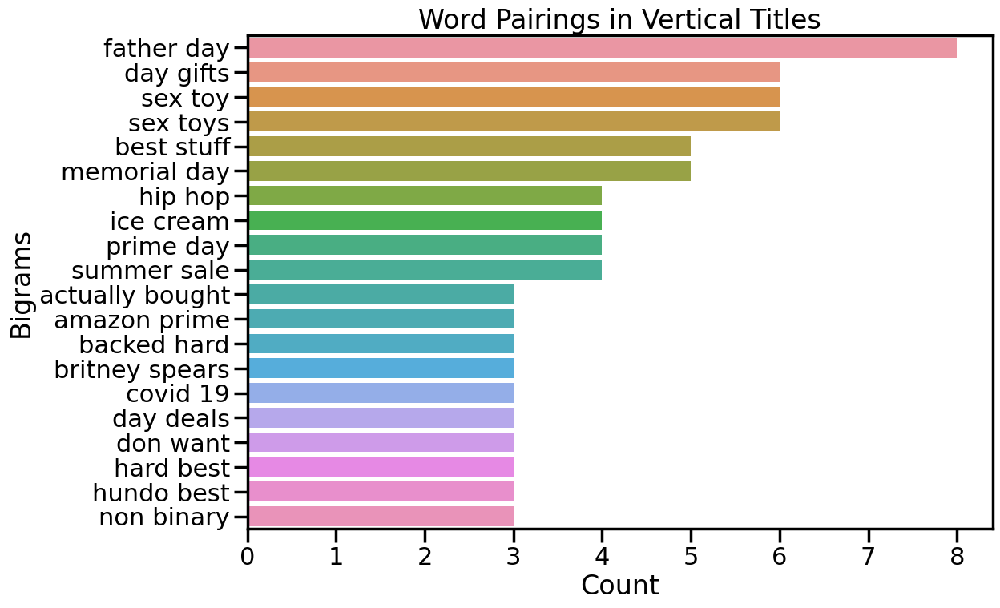

In [38]:
count_vec(US_culture_corpus)

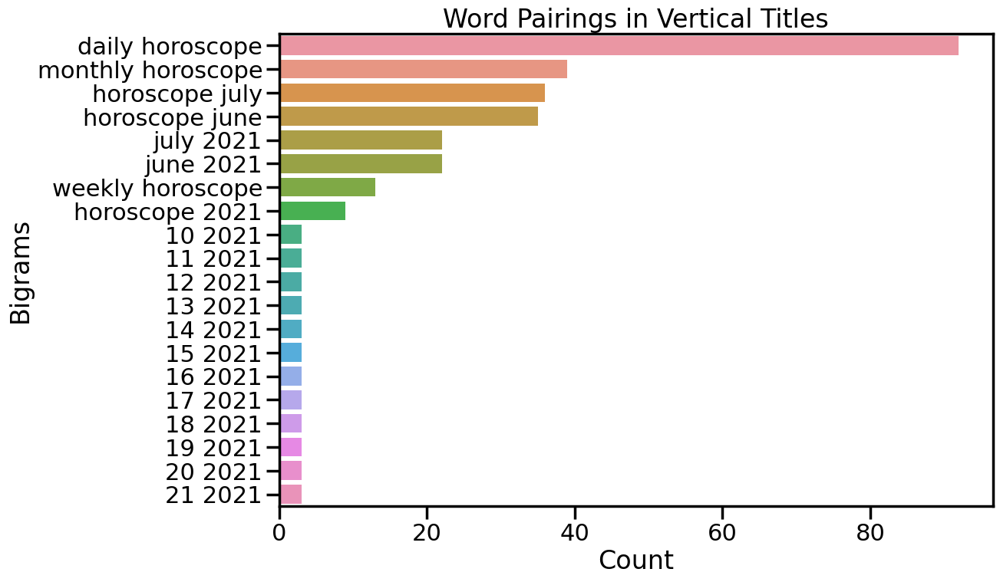

In [39]:
count_vec(horoscope_corpus)

In [40]:
from wordcloud import WordCloud

def get_word_cloud(text):
    """
    parameter: text, doc, corpus
    returns: word cloud
    base case
    doesn't generate clouds based on weights
    """
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color="white").generate(str(text))
    fig = plt.figure(
        figsize= (40,30), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

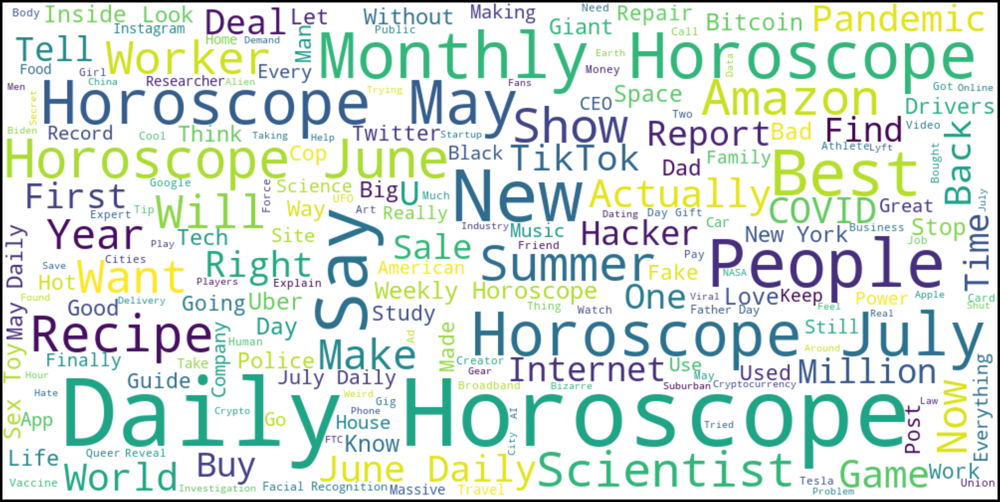

In [41]:
get_word_cloud(out)

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.feature_extraction.text import TfidfTransformer
def create_cloud(docs):
    """
    
    parameters: corpus (all article titles for a particular vertical)
    returns: word clouds based on weights
    
    """
    #title = docs.name
    # calculates the weight for each word 
    vectorizer = TfidfVectorizer(analyzer="word",  min_df=0, stop_words='english')
    tfidf_matrix= vectorizer.fit_transform(docs)
    feature_names = vectorizer.get_feature_names_out()
    dense = tfidf_matrix.todense()
    denselist = dense.tolist()
    tfidf_df = pd.DataFrame(denselist, columns=feature_names)
 
    # takes in weights and outputs a wordcloud
    cloud = WordCloud(background_color="white", max_words=70).generate_from_frequencies(tfidf_df.T.sum(axis=1))
    fig = plt.figure(
        figsize= (30,20), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()


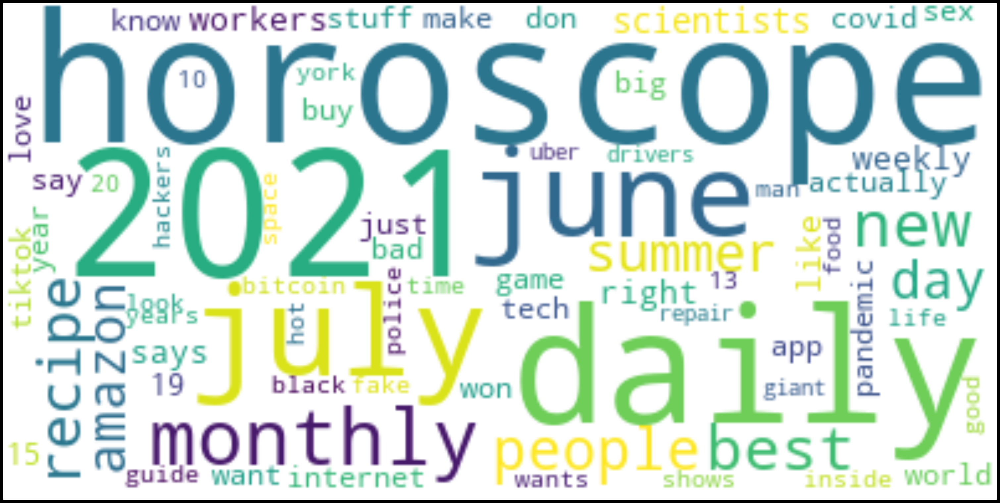

In [43]:
create_cloud(df.original_article_title.unique())

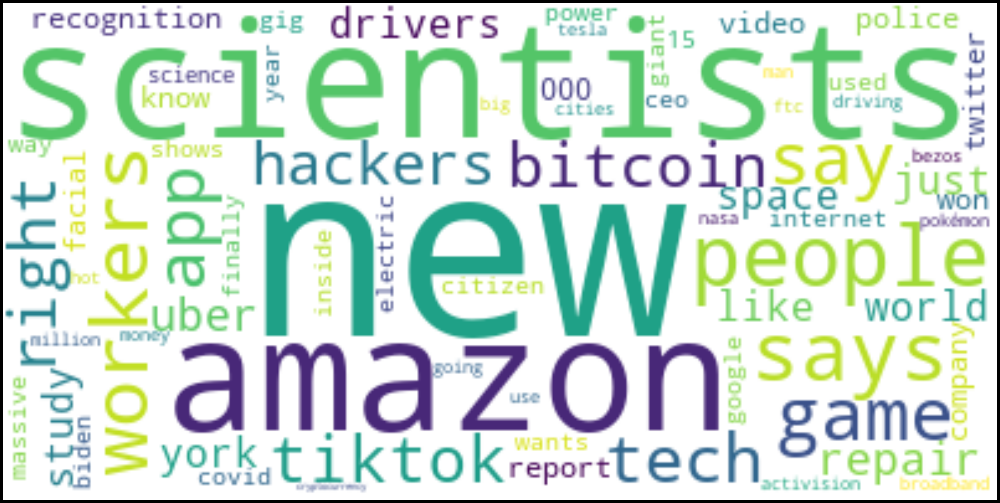

In [44]:
create_cloud(motherboard_df.original_article_title.unique())

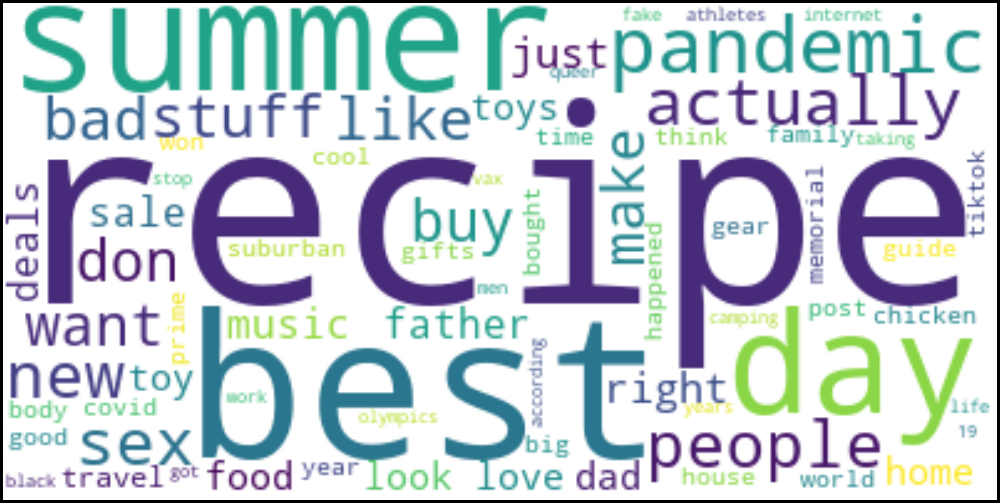

In [45]:
create_cloud(US_Culture_df.original_article_title.unique())

In [82]:
weekday_count = pd.DataFrame({"weekday":["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday" ,"Saturday"],
"count": [15,219,228,233,258,205,25]})
weekday_count

,weekday,count
0,Sunday,15
1,Monday,219
2,Tuesday,228
3,Wednesday,233
4,Thursday,258
5,Friday,205
6,Saturday,25


In [87]:
vertical_df = pd.DataFrame({"vertical":["Horoscope", "Motherboard", "US Culture"], 
              "total_articles":[144,558,484],
              "total_traffic":[6611382,17288463,6791201]  })
vertical_df

,vertical,total_articles,total_traffic
0,Horoscope,144,6611382
1,Motherboard,558,17288463
2,US Culture,484,6791201


In [90]:
fig = px.bar(vertical_df, x='vertical', y='total_traffic', color='vertical',
             title='Traffic by Vertical')

# Customize the layout (optional)
fig.update_layout(
    xaxis_title='Editorial Department',
    yaxis_title='Total Traffic',
    autosize=False,
    showlegend=False,
    width=600,  # Adjust width for your preferences
    height=400  # Adjust height for your preferences
)

# Show the plot
fig.show()

In [88]:
fig = px.bar(weekday_count, x='weekday', y='count', color='weekday',
             title='Article Ouput per Weekday')

# Customize the layout (optional)
fig.update_layout(
    xaxis_title='Weekday',
    yaxis_title='Articles Posted',
    autosize=False,
    showlegend=False,
    width=600,  # Adjust width for your preferences
    height=400  # Adjust height for your preferences
)

# Show the plot
fig.show()

In [105]:
social = pd.DataFrame({"social": ["Snapchat", "YouTube", "Twitter", "Instagram", "Facebook", "Reddit"],
                       "followers": [7.74, 17.1, 1.9, 5.1, 10.0, 0.0075] })
social

,social,followers
0,Snapchat,7.7400
1,YouTube,17.1000
2,Twitter,1.9000
3,Instagram,5.1000
4,Facebook,10.0000
5,Reddit,0.0075


In [112]:
fig = px.bar(social, x='social', y='followers', color='social',
             title='Follower Count by Social Media Platform')

# Customize the layout (optional)
fig.update_layout(
    xaxis_title='Social Media App',
    yaxis_title='Followers (Millions)',
    autosize=False,
    showlegend=False,
    width=600,  # Adjust width for your preferences
    height=400  # Adjust height for your preferences
)

# Show the plot
fig.show()

In [110]:
df.groupby("original_article_title")["page_views"].count().sort_values()

original_article_title
A Brief History of the 'Beer Snake'                                                                      1
Athletes Will Get Condoms as a Parting Gift After Tokyo Games, Organizers Say                            3
A Brief History of the 'Beer Snake' \n                                                                   3
Only One NYC Mayor Candidate Is Promising to Ban Facial Recognition                                      4
Oregon Has Legalized Human Composting                                                                    4
                                                                                                        ..
Why Do I Get Anxious When I Have a Hangover?                                                            24
The Internet's Terminally Stoned Mascot '10 Guy' Finally Speaks                                         24
Why Can't I Stop Feeling Jealous About 'That One Friend' My Partner Has?                                30
Scientists Stu

In [111]:
total_page_views = df.groupby("original_article_title")["page_views"].sum().sort_values()
total_page_views

original_article_title
China Is Running Out of Lab Monkeys To Experiment On                                                        975
'Micro Grants' Are Keeping Virginians Afloat While Waiting For Unemployment                                 977
How an Earth-Sized Telescope Images Supermassive Black Holes                                                979
A Plan to Tame Labor Unions for Uber and Lyft Has Been Scrapped In New York                                 979
FTC Report to Congress: Repair Monopolies Harm the Public and the Planet                                    984
                                                                                                         ...   
Scientists Extracted DNA From 'Blood Snow' in the Alps. Here's What They Found.                          319355
Science YouTuber Wins $10,000 Bet With Physicist                                                         522206
Scientists Studying Temperature at Which Humans Spontaneously Die With Increasing